# Data Exploration

In the presented notebook we will try to explore the data and get some first insights around it.
* Analyze possible for anomalies
* Analyze tendencies 
* Explore possible collinearity between vairables
* Outliers

In [227]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from datetime import datetime
from matplotlib import pyplot
import altair as alt
from matplotlib.pyplot import figure
from matplotlib.axes._axes import _log as matplotlib_axes_logger
import pycountry
from matplotlib import pyplot as plt
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
import pygal
from pygal.maps.world import World
from IPython.core.display import display, HTML
matplotlib_axes_logger.setLevel('ERROR')
sns.set_theme(style="white")
alt.data_transformers.enable('default', max_rows=None)
plt.rcParams["figure.figsize"] = (20,10)

# Authenticate to Google Drive
(Request access to lucasbotellaroca@gmail.com if not conceded)

In [228]:
# A browser window will open. Login using the appropriate account.
gauth = GoogleAuth()
gauth.LocalWebserverAuth() #

Your browser has been opened to visit:

    https://accounts.google.com/o/oauth2/auth?client_id=267819126046-3da5rmgml4iemor49ermcv23tnaj02t5.apps.googleusercontent.com&redirect_uri=http%3A%2F%2Flocalhost%3A8080%2F&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&access_type=offline&response_type=code

Authentication successful.


In [229]:
drive = GoogleDrive(gauth)

In [230]:
drive

In [231]:
def read_csv_file(folder, fileName, nrows):
    
    read_file = drive.ListFile({'q': "title contains '" + fileName + ".csv' and '" + folder + "' in parents"}).GetList()
    
    if len(read_file)>0:
        title = read_file[0]['title']
        id = read_file[0]['id']
        each_file = drive.CreateFile({'id': id})
        each_file.GetContentFile(title)
        df = pd.read_csv(title, skiprows=nrows)
    else:
        
        df=pd.DataFrame()
    
    return df

##### get_reproduction_rate_previous_2_weeks()
*Auxiliary function that groups data for every 2 weeks in order to have more variability and better appreciation of restrictions and changes in our target variable reproduction rate.

In [362]:
def get_reproduction_rate_previous_2_weeks(df):
    rate_tendency=[]
    country='AUS'

    for index, row in df.iterrows():
        country_last=row['Code']

        if(country==country_last):

            date_1 = pd.to_datetime(row['Date']) - pd.to_timedelta(14, unit='d')
            s_1 = df[(df['Code']==country) & (pd.to_datetime(df['Date'])== date_1)]['reproduction_rate']
           

            if (s_1.size==0):

                n=row['reproduction_rate']

            else: 
               
                n=s_1.iloc[0]

            rate_tendency.append(n)

        else:
            country=country_last
            rate_tendency.append(row['reproduction_rate'])

    return rate_tendency

## Read file and prepare data

In [471]:
#df=pd.read_csv('../df_covid_processed_final_reproduction_rate.csv')
df=read_csv_file('1kNVBQTd_m6OihGl5zXfkcbin9BtKzFEw','df_covid_processed_final_reproduction_rate',0)

#Selected columns for our analysis
df=df[['Code', 'Date', 'retail_and_recreation',
       'grocery_and_pharmacy', 'residential', 'transit_stations', 'parks',
       'workplaces', 'debt_relief', 'income_support', 'testing_policy',
       'international_travel_controls', 'restrictions_internal_movements',
       'close_public_transport', 'public_information_campaigns',
       'facial_coverings', 'contact_tracing', 
       'stay_home_requirements', 'restriction_gatherings',
       'cancel_public_events', 'workplace_closures', 'school_closures',
       'holiday', 'temp', 'prcp', 'number_of_arrivals', 'urban_population',
      'total_vaccinations_per_100', 'youth_unemployment','infections_value',
      'accumulated',  'reproduction_rate']]

# Data grouped in 2 weeks periods in order to have more variability in our restrictions and target variable between weeks.
df['Date'] = pd.to_datetime(df['Date'])
df = df.groupby(['Code', pd.Grouper(key='Date', freq='2W-SUN')]).mean().reset_index()
df['reproduction_rate_week_n-2']=get_reproduction_rate_previous_week(df)
df=df[[c for c in df if c not in ['reproduction_rate']] 
       + ['reproduction_rate']]
df

,Code,Date,retail_and_recreation,grocery_and_pharmacy,residential,transit_stations,parks,workplaces,debt_relief,income_support,...,temp,prcp,number_of_arrivals,urban_population,total_vaccinations_per_100,youth_unemployment,infections_value,accumulated,reproduction_rate_week_n-2,reproduction_rate
0,AUS,2020-03-22,0.714429,8.979571,-0.387571,5.448857,-2.857143,8.326571,0.000000,0.0,...,21.346512,0.142010,8263000.0,85.904,NaN,11.84,7.280,0.002502,2.170000,2.170000
1,AUS,2020-04-05,-5.744929,18.591786,2.775500,-11.449000,-9.897929,3.020357,0.142857,1.0,...,20.939890,0.053343,8263000.0,85.904,NaN,11.84,11.720,0.003440,2.170000,2.305000
2,AUS,2020-04-19,-36.540929,-6.183786,15.520286,-54.489857,-33.755143,-29.040786,2.000000,1.0,...,19.987036,0.095946,8263000.0,85.904,NaN,11.84,4.655,0.005606,2.305000,1.111429
3,AUS,2020-05-03,-42.632571,-13.734857,19.632571,-62.428643,-35.979571,-44.683643,2.000000,1.0,...,19.008360,0.046547,8263000.0,85.904,NaN,11.84,4.465,0.007019,1.111429,0.432857
4,AUS,2020-05-17,-38.224500,-9.806071,16.112214,-56.928643,-32.959286,-34.867286,2.000000,1.0,...,16.998547,0.082838,8263000.0,85.904,NaN,11.84,0.940,0.008205,0.432857,0.589286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1832,USA,2021-03-07,-25.836786,-12.367429,11.663214,-40.408071,-26.530500,-31.112214,1.000000,2.0,...,-1.592176,0.063226,75608000.0,82.058,17.060714,8.30,8.740,0.236746,0.802857,0.788571
1833,USA,2021-03-21,-16.010286,-7.826500,8.132643,-33.132571,-7.234643,-24.826286,1.000000,2.0,...,5.483458,0.039827,75608000.0,82.058,24.565714,8.30,NaN,0.239994,0.788571,0.887143
1834,USA,2021-04-04,-10.877643,-4.846786,7.244929,-28.673429,4.091857,-25.622571,1.000000,2.0,...,7.333156,0.072394,75608000.0,82.058,34.388571,8.30,NaN,0.239994,0.887143,0.981429
1835,USA,2021-04-18,-8.244929,-2.071500,6.540714,-25.816214,14.897929,-26.428571,1.000000,2.0,...,9.498241,0.083318,75608000.0,82.058,45.760000,8.30,NaN,0.239994,0.981429,1.060714


- 1837 and 33 columns before doing any filtering, nan treatment or feature engineering.

In [427]:
df.columns

Index(['Code', 'Date', 'retail_and_recreation', 'grocery_and_pharmacy',
       'residential', 'transit_stations', 'parks', 'workplaces', 'debt_relief',
       'income_support', 'testing_policy', 'international_travel_controls',
       'restrictions_internal_movements', 'close_public_transport',
       'public_information_campaigns', 'facial_coverings', 'contact_tracing',
       'stay_home_requirements', 'restriction_gatherings',
       'cancel_public_events', 'workplace_closures', 'school_closures',
       'holiday', 'temp', 'prcp', 'number_of_arrivals', 'urban_population',
       'total_vaccinations_per_100', 'youth_unemployment', 'infections_value',
       'accumulated', 'reproduction_rate_week_n-2', 'reproduction_rate'],
      dtype='object')

In [428]:
df.describe()

,retail_and_recreation,grocery_and_pharmacy,residential,transit_stations,parks,workplaces,debt_relief,income_support,testing_policy,international_travel_controls,...,temp,prcp,number_of_arrivals,urban_population,total_vaccinations_per_100,youth_unemployment,infections_value,accumulated,reproduction_rate_week_n-2,reproduction_rate
count,1836.000000,1836.000000,1837.000000,1837.000000,1835.000000,1837.000000,1837.000000,1837.000000,1837.000000,1837.000000,...,1747.000000,1747.000000,1.807000e+03,1807.000000,486.000000,1807.000000,1257.000000,1807.000000,1837.000000,1837.000000
mean,-28.339863,-6.357631,9.468231,-32.392000,6.558439,-25.420584,1.264795,1.378568,2.047515,2.856754,...,14.633130,0.075942,1.325793e+07,72.397700,10.897135,13.935025,16.943409,0.059122,1.121051,1.087090
std,21.461477,17.072923,8.092868,19.452897,55.521993,14.550134,0.721259,0.677507,0.702381,0.954523,...,9.991022,0.090232,1.857159e+07,15.796361,16.961265,7.809076,29.121017,0.078517,0.427519,0.373186
min,-90.489929,-76.704143,-9.295929,-88.387714,-83.061071,-80.877643,0.000000,0.000000,0.000000,0.000000,...,-23.752611,0.000000,1.210000e+05,36.135000,0.000000,0.470000,-95.590000,0.000000,0.012857,0.012857
25%,-42.502518,-13.505054,3.520357,-44.938786,-27.448929,-32.867357,1.000000,1.000000,2.000000,2.000000,...,6.845098,0.017861,2.292000e+06,58.299000,0.640179,8.510000,1.175000,0.006286,0.910714,0.904286
50%,-25.836821,-3.908214,8.619000,-31.540714,-6.418357,-23.918357,1.000000,1.285714,2.000000,3.000000,...,15.091582,0.050404,5.967000e+06,74.669000,4.217857,11.400000,7.570000,0.024102,1.065714,1.054286
75%,-12.599464,2.301036,13.704000,-19.091929,23.954071,-16.449071,2.000000,2.000000,3.000000,3.714286,...,22.873569,0.099734,1.582800e+07,85.325000,15.078839,17.090000,24.650000,0.085784,1.249286,1.222857
max,47.938857,76.806000,40.561071,70.040714,377.642786,34.173357,2.000000,2.000000,3.000000,4.000000,...,37.391255,1.005301,8.257000e+07,100.000000,120.655000,35.110001,409.190000,0.427355,4.285000,4.285000


In [429]:
df.isna().sum()

Code                                  0
Date                                  0
retail_and_recreation                 1
grocery_and_pharmacy                  1
residential                           0
transit_stations                      0
parks                                 2
workplaces                            0
debt_relief                           0
income_support                        0
testing_policy                        0
international_travel_controls         0
restrictions_internal_movements       0
close_public_transport                0
public_information_campaigns          0
facial_coverings                      0
contact_tracing                       0
stay_home_requirements                0
restriction_gatherings                0
cancel_public_events                  0
workplace_closures                    0
school_closures                       0
holiday                               0
temp                                 90
prcp                                 90


* Temperature and precipitation contain 90 nulls values.
* "total_vaccinations_per_100" contains 1351 nulls, will replace them by zeros, meaning no vaccines administered.
* infectious value cotains 580, will simply drop those entries since there is no excess mortality recorded for those entries, hence it would affect our predictions, since inmunity is important in the spread of the virus.

In [430]:
df = df[df['infections_value'].notna()]
df = df[df['accumulated'].notna()]
df['total_vaccinations_per_100'] = df['total_vaccinations_per_100'].fillna(0)
df['infections_value'][df['infections_value'] < 0] = 0

<ipython-input-430-71263b5c057b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['infections_value'][df['infections_value'] < 0] = 0


* After treating data and managing null values we are left with the following dataset

In [431]:
df

,Code,Date,retail_and_recreation,grocery_and_pharmacy,residential,transit_stations,parks,workplaces,debt_relief,income_support,...,temp,prcp,number_of_arrivals,urban_population,total_vaccinations_per_100,youth_unemployment,infections_value,accumulated,reproduction_rate_week_n-2,reproduction_rate
0,AUS,2020-03-22,0.714429,8.979571,-0.387571,5.448857,-2.857143,8.326571,0.000000,0.0,...,21.346512,0.142010,8263000.0,85.904,0.000000,11.84,7.280,0.002502,2.170000,2.170000
1,AUS,2020-04-05,-5.744929,18.591786,2.775500,-11.449000,-9.897929,3.020357,0.142857,1.0,...,20.939890,0.053343,8263000.0,85.904,0.000000,11.84,11.720,0.003440,2.170000,2.305000
2,AUS,2020-04-19,-36.540929,-6.183786,15.520286,-54.489857,-33.755143,-29.040786,2.000000,1.0,...,19.987036,0.095946,8263000.0,85.904,0.000000,11.84,4.655,0.005606,2.305000,1.111429
3,AUS,2020-05-03,-42.632571,-13.734857,19.632571,-62.428643,-35.979571,-44.683643,2.000000,1.0,...,19.008360,0.046547,8263000.0,85.904,0.000000,11.84,4.465,0.007019,1.111429,0.432857
4,AUS,2020-05-17,-38.224500,-9.806071,16.112214,-56.928643,-32.959286,-34.867286,2.000000,1.0,...,16.998547,0.082838,8263000.0,85.904,0.000000,11.84,0.940,0.008205,0.432857,0.589286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1828,USA,2021-01-10,-20.234643,-4.020429,11.418500,-37.459286,-18.204143,-35.091786,1.000000,2.0,...,2.296861,0.059487,75608000.0,82.058,0.451667,8.30,42.945,0.184976,1.095000,0.977857
1829,USA,2021-01-24,-23.806214,-10.612286,12.755214,-40.295857,-19.224429,-35.357000,1.000000,2.0,...,1.849448,0.066435,75608000.0,82.058,1.939500,8.30,34.260,0.205035,0.977857,1.070000
1830,USA,2021-02-07,-25.255071,-13.499929,10.765071,-40.734714,-20.091929,-28.816214,1.000000,2.0,...,2.291674,0.043928,75608000.0,82.058,5.282857,8.30,26.560,0.220400,1.070000,0.870714
1831,USA,2021-02-21,-25.214286,-13.438786,10.428429,-41.153000,-24.530714,-27.714214,1.000000,2.0,...,-0.303134,0.044132,75608000.0,82.058,10.600000,8.30,14.225,0.230417,0.870714,0.802857


In [432]:
df.isna().sum()

Code                                0
Date                                0
retail_and_recreation               0
grocery_and_pharmacy                0
residential                         0
transit_stations                    0
parks                               1
workplaces                          0
debt_relief                         0
income_support                      0
testing_policy                      0
international_travel_controls       0
restrictions_internal_movements     0
close_public_transport              0
public_information_campaigns        0
facial_coverings                    0
contact_tracing                     0
stay_home_requirements              0
restriction_gatherings              0
cancel_public_events                0
workplace_closures                  0
school_closures                     0
holiday                             0
temp                               45
prcp                               45
number_of_arrivals                  0
urban_popula

* 1237 rows with 33 columns
* Only 45 null values on temperature and precipitation
* One null value for parks

### Countries included in the Analysis

In [433]:
def country_name(country):
    return pycountry.countries.get(alpha_3=country).name
def country_code_2_lower(country):
    return pycountry.countries.get(alpha_3=country).alpha_2.lower()

In [434]:
country_list=df.Code.unique()
country_names_list=[country_name(country) for country in country_list]
country_names_list_code2_lower=[country_code_2_lower(country) for country in country_list]

* List of countries with country code included for help. 

In [475]:
for i in range(len(country_names_list)):
    print(country_names_list_code2_lower[i].upper() + " - " + country_names_list[i])

AU - Australia
AT - Austria
BE - Belgium
BG - Bulgaria
BY - Belarus
BO - Bolivia, Plurinational State of
BR - Brazil
CA - Canada
CH - Switzerland
CL - Chile
CO - Colombia
CR - Costa Rica
CZ - Czechia
DE - Germany
DK - Denmark
EC - Ecuador
EG - Egypt
ES - Spain
EE - Estonia
FI - Finland
FR - France
GB - United Kingdom
GE - Georgia
GR - Greece
GT - Guatemala
HR - Croatia
HU - Hungary
IL - Israel
IT - Italy
JM - Jamaica
JP - Japan
KG - Kyrgyzstan
KR - Korea, Republic of
LT - Lithuania
LU - Luxembourg
LV - Latvia
MD - Moldova, Republic of
MX - Mexico
MT - Malta
MN - Mongolia
MU - Mauritius
NI - Nicaragua
NL - Netherlands
NO - Norway
NZ - New Zealand
OM - Oman
PA - Panama
PH - Philippines
PL - Poland
PT - Portugal
PY - Paraguay
QA - Qatar
RO - Romania
SG - Singapore
SV - El Salvador
RS - Serbia
SK - Slovakia
SI - Slovenia
SE - Sweden
TH - Thailand
US - United States


In [435]:
worldmap_chart = World()

worldmap_chart.title = 'Countries included in the analysis'

for i in range(len(country_names_list)):
    worldmap_chart.add(country_names_list[i], country_names_list_code2_lower[i])
    
worldmap_chart.render_to_file('mymap.html')

In [436]:
display(HTML(worldmap_chart.render(is_unicode=True)))

In [437]:
df.Code.unique().size

61

* There is a total of 61 countries in our data set.
* Most of countries in Europe and North America are included.
* Very few data on African and Asian countries.

### Correlation Matrix

<AxesSubplot:>

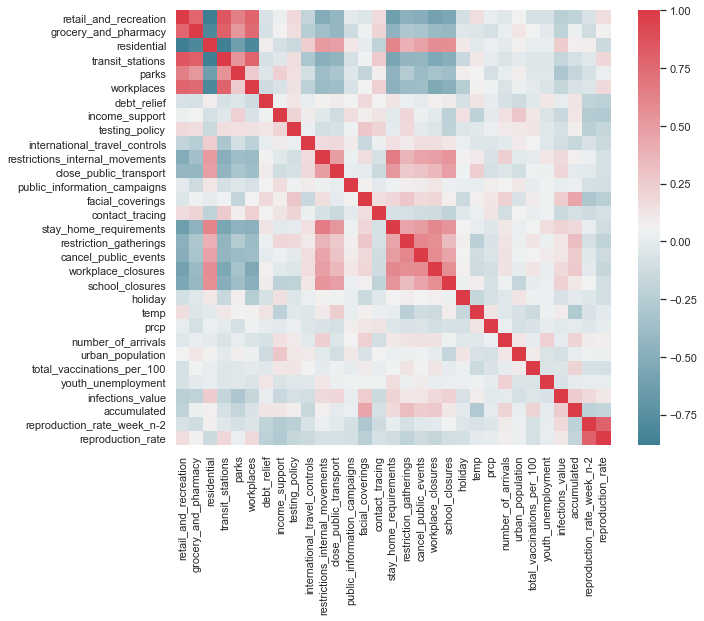

In [438]:
f, ax = plt.subplots(figsize=(10, 8))
corr = df.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)

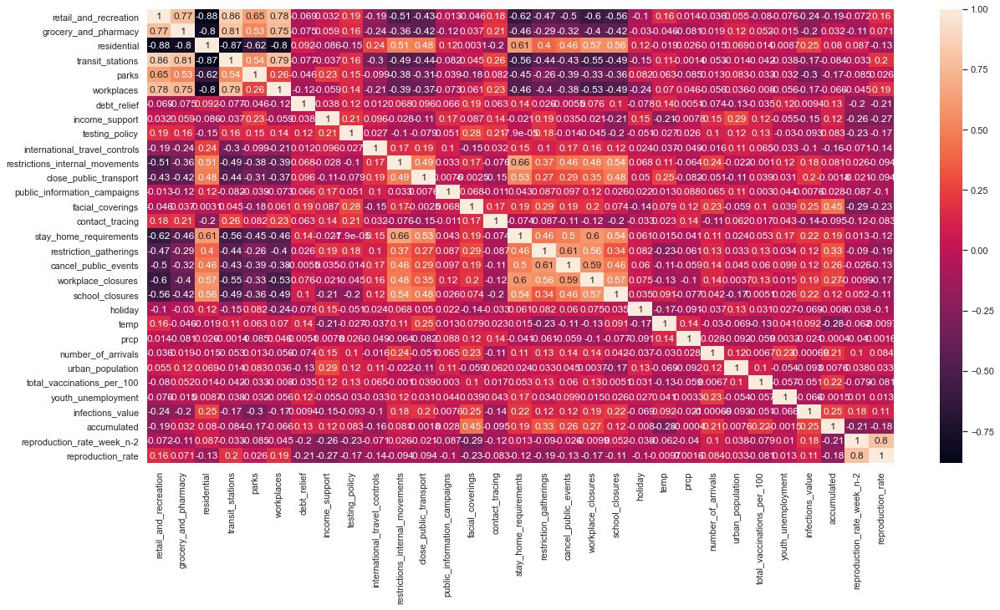

In [439]:
corrMatrix = df.corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()

In [440]:
np.abs(corrMatrix['reproduction_rate']).sort_values(ascending=False)

reproduction_rate                  1.000000
reproduction_rate_week_n-2         0.799479
income_support                     0.272012
facial_coverings                   0.232905
debt_relief                        0.213369
transit_stations                   0.198362
restriction_gatherings             0.192401
workplaces                         0.190754
accumulated                        0.182623
workplace_closures                 0.166510
testing_policy                     0.165805
retail_and_recreation              0.163643
international_travel_controls      0.140860
residential                        0.133521
cancel_public_events               0.128418
stay_home_requirements             0.115736
infections_value                   0.110625
school_closures                    0.106910
public_information_campaigns       0.102851
holiday                            0.102663
restrictions_internal_movements    0.094492
close_public_transport             0.094268
number_of_arrivals              

* There is a high multicollinearity between variables, Mobility trends are highly correlated with each other values close to 1
* There is also a high multicollinearity in restrictions, meaning restrictions are applied together
* Even more, there is multicollinearity between mobility trends and restrictions, which is something expected.
* Restrictions that most affect mobility seem to be "stay_at_home_requirements", "restrictions_gatherings", "cancel_public_events", "workplace_closures" and "school_closures"
* Our target variable "reproduction_rate"  highest collinearity is mainly with mobility trends.
* reproduction_rate_week_n-2 has a collinearity of 0.8 with our target variable.

### Multicollinearity VIF Analysis

In [441]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [442]:
df_aux_vif=df.dropna()
df_aux_vif=df_aux_vif[~df_aux_vif.isin([np.inf, -np.inf]).any(1)]
vif_data=pd.DataFrame()
vif_data["VIF"] = [variance_inflation_factor(df_aux_vif[df_aux_vif.columns[2:-1]].values, i)
                          for i in range(len(df_aux_vif[df_aux_vif.columns[2:-1]].columns))]
vif_data.index=df_aux_vif.columns[2:-1]
print(vif_data)

                                       VIF
retail_and_recreation            24.223598
grocery_and_pharmacy              5.828108
residential                      28.249620
transit_stations                 28.886635
parks                             4.019250
workplaces                       32.729042
debt_relief                       5.627390
income_support                   10.247390
testing_policy                   13.293142
international_travel_controls    14.346816
restrictions_internal_movements   5.809637
close_public_transport            3.382500
public_information_campaigns     63.528440
facial_coverings                  7.725321
contact_tracing                   9.593497
stay_home_requirements            8.145783
restriction_gatherings           19.867184
cancel_public_events             19.365095
workplace_closures               16.723880
school_closures                  14.466238
holiday                           1.655349
temp                              4.930381
prcp       

In [443]:
vif_data[vif_data['VIF']>5].count()

VIF    21
dtype: int64

* VIF values with vif>5 are said to be values with very high correlation, therefore, most of our dataset contains high correlation, 20 out of 33 columns have high correlation.
* As seen lots of variables have very high VIF values, therefore based on the correlaion matrix and the presented VIF analysis, there is lot of multicollineaity between variables.

In [444]:
vif_data[vif_data['VIF']>5].index

Index(['retail_and_recreation', 'grocery_and_pharmacy', 'residential',
       'transit_stations', 'workplaces', 'debt_relief', 'income_support',
       'testing_policy', 'international_travel_controls',
       'restrictions_internal_movements', 'public_information_campaigns',
       'facial_coverings', 'contact_tracing', 'stay_home_requirements',
       'restriction_gatherings', 'cancel_public_events', 'workplace_closures',
       'school_closures', 'urban_population', 'youth_unemployment',
       'reproduction_rate_week_n-2'],
      dtype='object')

Those variables are mainly:
* Mobility Indexes: 
       'retail_and_recreation', 'grocery_and_pharmacy', 'residential',
       'transit_stations', 'workplaces'
* Government Measures: 
       'debt_relief', 'income_support',
       'testing_policy', 'international_travel_controls',
       'restrictions_internal_movements', 'public_information_campaigns',
       'facial_coverings', 'contact_tracing', 'stay_home_requirements',
       'restriction_gatherings', 'cancel_public_events', 'workplace_closures',
       'school_closures'

**Approach to reduce multicollinerity is grouping variables with high multicollinearity**

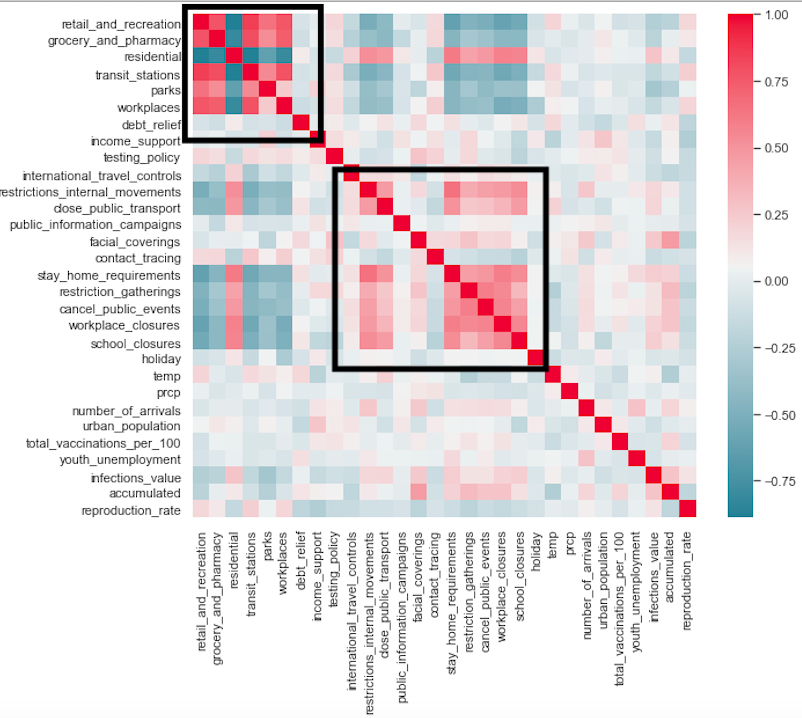

* Those set of variables will be grouped under one single group since they have high correlation.

* Variables grouped as **mobility_index** are variables that have a positive relation in the spread of the virus. Those variables are "retail_and_recreation", "transit_stations", "grocery_and_pharmacy", "workplaces". They have been ponderated to an approximation of more or less effect on the response variable.

* Variables grouped as **awareness_measures** are variables that represent the conciency and awareness given from governments to the population, most meaningful one is "facial_coverings".

* Variables grouped as **economic_measures** are measures that support debt and income, which prevents workers from going to work and thus decreasing mobility and activity.

* Variables grouped as **health_measures** are measures that support tracing and testing of cases.

* Variables grouped as **mobility_measures_and_closure_measures** are measures that limit mobility and interactions between individuals of different households and cities. They also include measures that limit usual work and school life together with events.

In [445]:
df_appch2=df.copy()
df_appch2['mobility_index']=(df_appch2['retail_and_recreation']*0.4+df_appch2['transit_stations']*0.4
                           +df_appch2['grocery_and_pharmacy']*0.1+df_appch2['workplaces']*0.1)

df_appch2['awareness_measures'] = df_appch2['public_information_campaigns']*0.2+df_appch2['facial_coverings']*0.8

df_appch2['economic_measures']=df_appch2['debt_relief']*0.5+df_appch2['income_support']*0.5

df_appch2['health_measures']=df_appch2['contact_tracing']*0.5+df_appch2['testing_policy']*0.5

df_appch2['mobility_closures_measures']=0.3*df_appch2['stay_home_requirements']\
                                + 0.3*df_appch2['restriction_gatherings']\
                                + 0.2*df_appch2['restrictions_internal_movements']\
                                + 0.1*df_appch2['international_travel_controls']\
                                + 0.1*df_appch2['close_public_transport']\
                                + 0.2*df_appch2['cancel_public_events']\
                                + 0.4*df_appch2['workplace_closures']\
                                + 0.4*df_appch2['school_closures']

df_appch2=df_appch2[['Code', 'Date','mobility_index', 'residential',
                     'awareness_measures', 'health_measures',
                     'mobility_closures_measures', 'economic_measures',
                     'holiday', 'temp', 'prcp', 
                     'number_of_arrivals', 'urban_population',
                     'total_vaccinations_per_100', 'youth_unemployment',
                     'infections_value', 'accumulated', 'reproduction_rate']]

<AxesSubplot:>

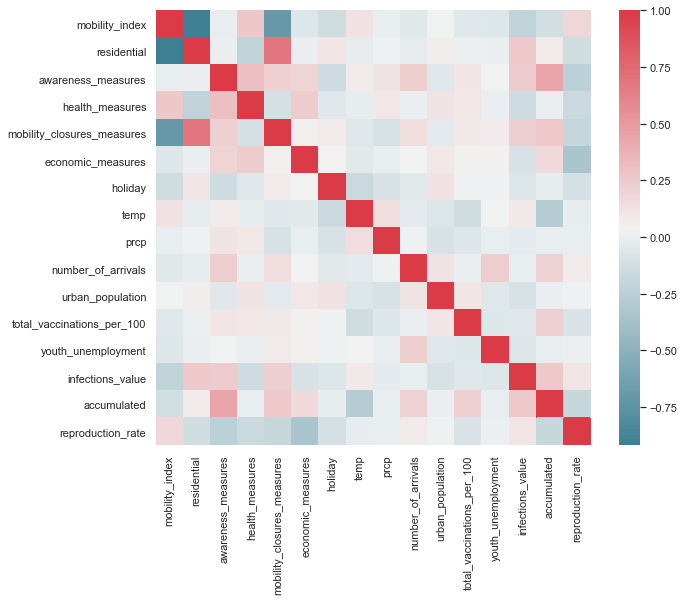

In [446]:
f, ax = plt.subplots(figsize=(10, 8))
corr = df_appch2.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)

* After grouping we are left with the correlation matrix shown above that still has some linear correlations.

In [447]:
df_aux_vif=df_appch2.dropna()
df_aux_vif=df_aux_vif[~df_aux_vif.isin([np.inf, -np.inf]).any(1)]
vif_data=pd.DataFrame()
vif_data["VIF"] = [variance_inflation_factor(df_aux_vif[df_aux_vif.columns[2:-1]].values, i)
                          for i in range(len(df_aux_vif[df_aux_vif.columns[2:-1]].columns))]
vif_data.index=df_aux_vif.columns[2:-1]
print(vif_data)

                                  VIF
mobility_index              28.012099
residential                 21.358296
awareness_measures           9.168033
health_measures             16.595316
mobility_closures_measures  23.345411
economic_measures           10.299973
holiday                      1.426705
temp                         3.750165
prcp                         1.975562
number_of_arrivals           1.898321
urban_population            17.825181
total_vaccinations_per_100   1.141091
youth_unemployment           4.597726
infections_value             1.831082
accumulated                  2.753886


* As seen even after transformation and grouping of variables VIF values are high and multicollinearity is still existing.

### Features Distribution Plots

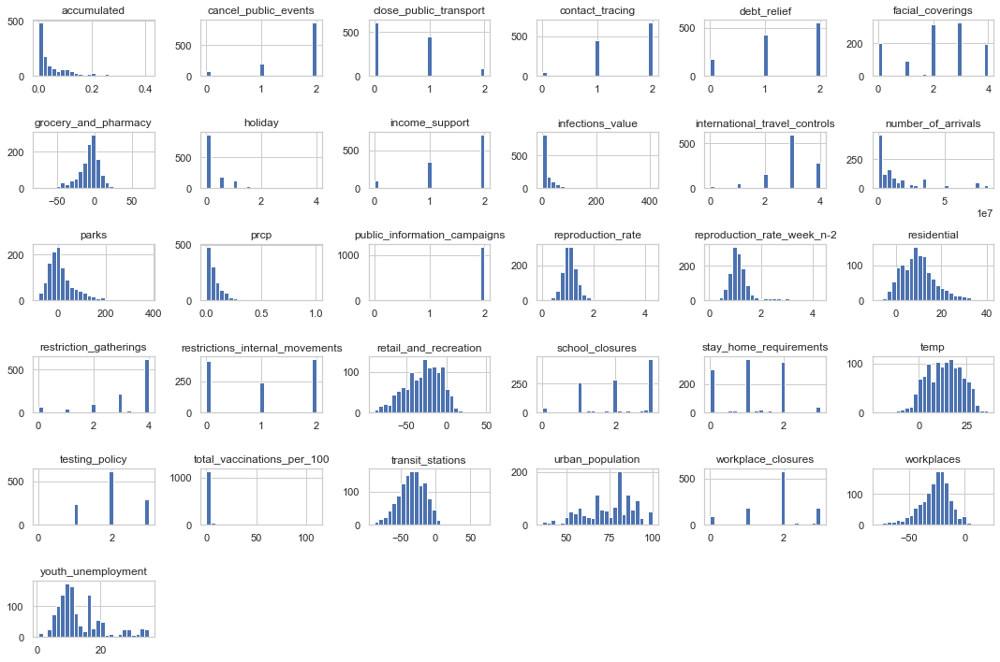

In [448]:
df.hist(bins=25, figsize=(15,10))
plt.tight_layout()
plt.show()

* There is set of numerical variables that are represented as "categorical". Restrictions as detailed have a discrete set of value most of them ranging from 0 to 3 in most cases. A more in detail description of the possible values this variables are capturing is detailed in the memory.pdf document.
* Restrictions are dicretized however the numerical values associated have a sense, lower values represent low restrictions, higher values represent strict restrictions.
* "prcp", "total_vaccinations" and "accumulated" seem to be skewed.

### Reproduction Rate Distribution 

Text(0.5, 1.0, 'reproduction_rate')

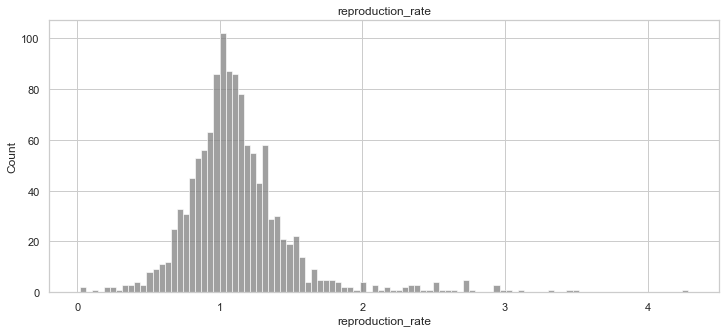

In [449]:
#Removing -inf and infinite
df=df[~df.isin([np.inf, -np.inf]).any(1)]
f, axes = plt.subplots(figsize=(12,5))
sns.histplot(x='reproduction_rate', data=df, kde=False, bins=100, ax=axes, color='grey');
axes.set_title('reproduction_rate')

In [450]:
df[['reproduction_rate']].describe()

,reproduction_rate
count,1237.000000
mean,1.127236
std,0.396564
min,0.017143
25%,0.919286
50%,1.072143
75%,1.265714
max,4.285000


* Our target variable ranges from 0 to 4.28 containing 50% of its values in range [0.9, 1.26]. This might be due to governments trying to find reproduction_rate of 1 constantly
* Values higher or equal to 2 refer to uncontrolled moments in the epidemic

<ipython-input-451-d76727e39dfe>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_acc['Date'] = pd.to_datetime(df_acc['Date'])


<AxesSubplot:xlabel='Date'>

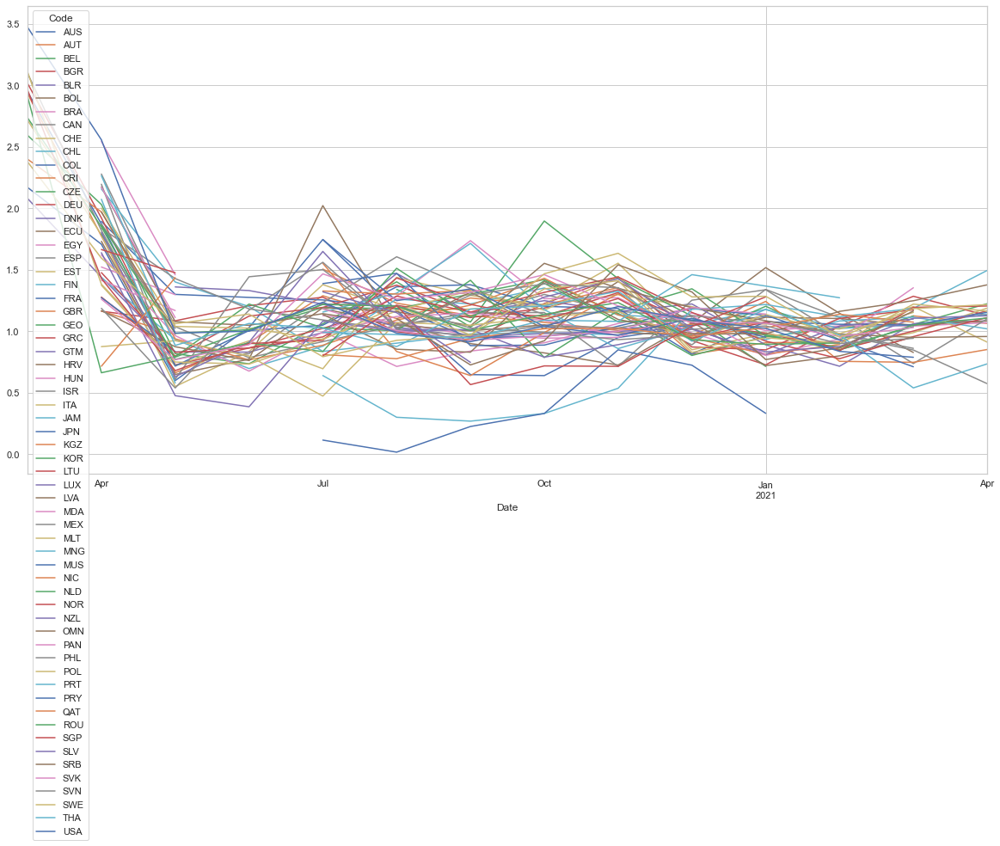

In [451]:
df_acc=df[['Code', 'Date', 'reproduction_rate']]
df_acc['Date'] = pd.to_datetime(df_acc['Date'])
df_acc=df_acc.groupby(by=[df_acc['Date'].dt.to_period('m'), df_acc['Code']]).mean().reset_index()
df_acc=df_acc.pivot(index="Date",columns="Code",values="reproduction_rate")
df_acc.plot()

* As it can be well appreciated reproduction rate values tend to be stabalized and its range of values tends to increasingly be closer to 1 as time passes.
* This might be due to governments trying to aim to fit the perfect reproduction rate of 1 and its decisions being more precise as time passes.
* It can be seen how highest values of reproduction rate are recorded in the beginning of the epidemic were no measures were taken and mobility trends were very large.

In [452]:
alt.Chart(df).mark_point().encode(
    x='reproduction_rate_week_n-2',
    y='reproduction_rate'
)

alt.Chart(...)

* As it can be seen values of reproduction rate in week n-2 is highly correlated with value in week n.
* It can be appreciated in the correlation matrix as well with a correlation of 0.8.
* Values that have same value in week n-2 and week n are first entries values that do not have any previous values.

### Reproduction rate distribution per country 

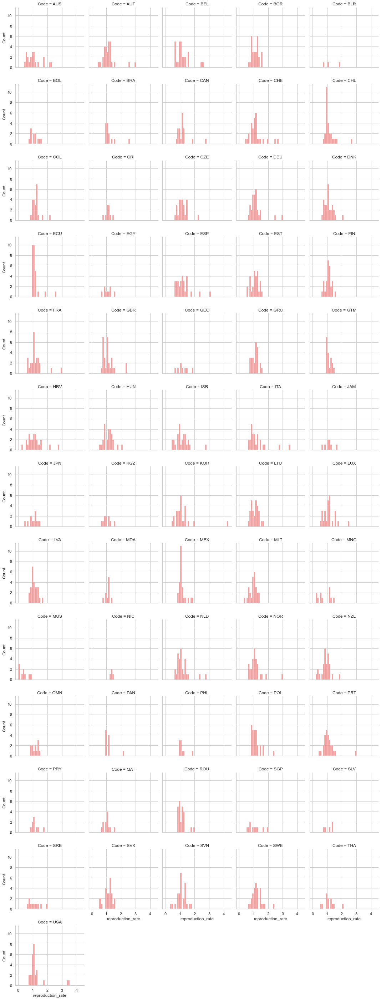

In [453]:
sns.displot(
    df, x="reproduction_rate", col="Code", col_wrap=5, kind='hist',
    binwidth=0.1, height=3, color='lightcoral');
plt.tight_layout()

### Restrictions

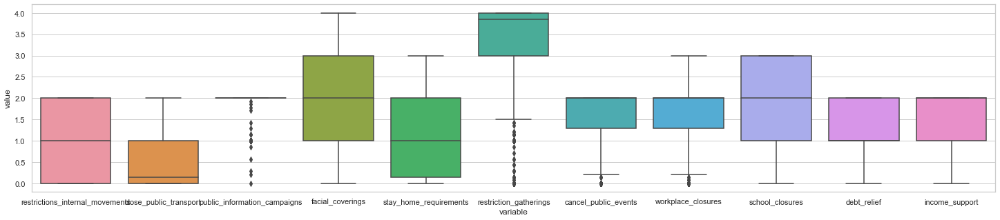

In [454]:
plt.subplots(figsize=(25,5))

df_restrictions=df[['restrictions_internal_movements', 'close_public_transport',
       'public_information_campaigns', 'facial_coverings',
       'stay_home_requirements', 'restriction_gatherings',
       'cancel_public_events', 'workplace_closures', 'school_closures',
       'debt_relief', 'income_support']]

sns.boxplot(x="variable", y="value",data=pd.melt(df_restrictions))
plt.show()

* Only restrictions with significant outlier are public information campaigns and facial coverings.
* Closing public transport and stay home requirements seem to be the restrictions less applied by governments.
* Restrictions in gatherings, school closures and facial coverings are the most common measures taken by governments

### Mobility Trends

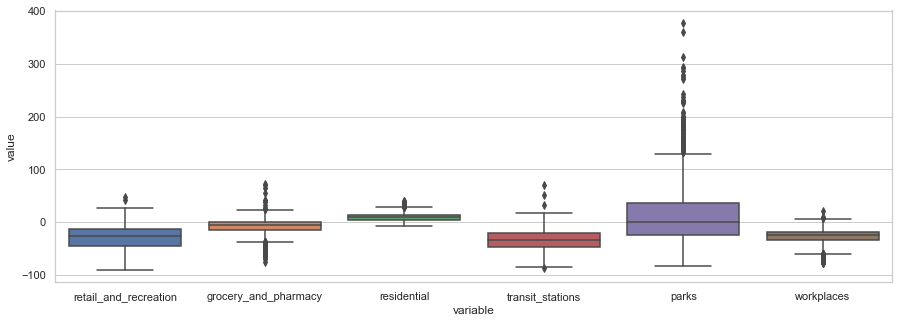

In [455]:
plt.subplots(figsize=(15,5))
sns.set_theme(style="whitegrid")

df_trends=df[['retail_and_recreation', 'grocery_and_pharmacy',
       'residential', 'transit_stations', 'parks', 'workplaces']]

sns.boxplot(x="variable", y="value",data=pd.melt(df_trends))
plt.show()

* All variables tend to have a small range of variables
* Variables parks, grocery_and_pharmacy and workplaces contain significant outliers

### Mobility Trends Pairplot

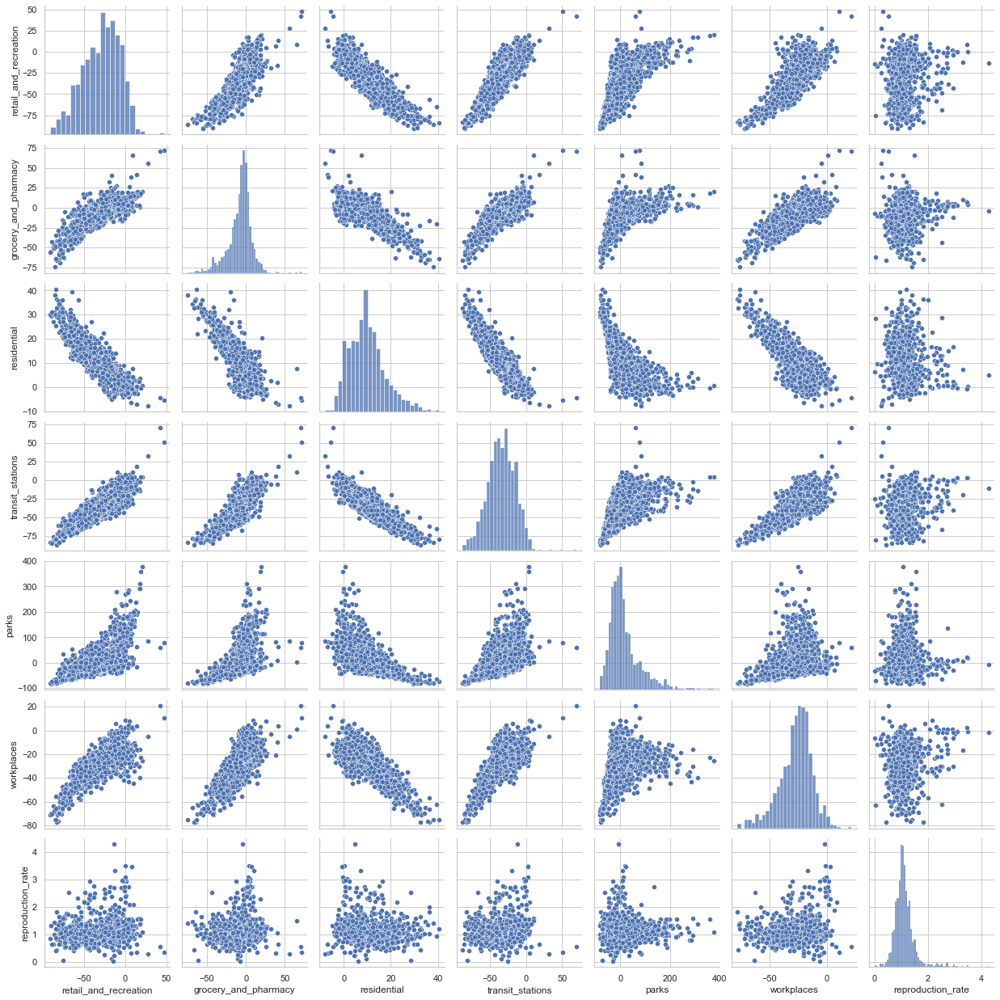

In [456]:
df_pairplot1=df[['retail_and_recreation', 'grocery_and_pharmacy',
       'residential', 'transit_stations', 'parks', 'workplaces', 'reproduction_rate']]
sns.pairplot(df_pairplot1)

* All mobility trends tend to be highly correlated negatively or positively.
* Multicollinearity between mobility trends
* The distribution in most mobility trends tends to be slighty positevly and negatively skewed  sepcially grocery_and_pharmacy and parks

### Restrictions Relation with reproduction rate

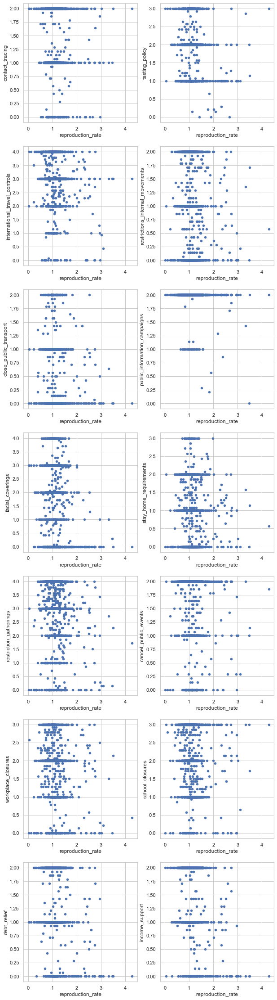

In [457]:
df_restrictions=df[['contact_tracing', 'testing_policy', 'international_travel_controls',
       'restrictions_internal_movements', 'close_public_transport',
       'public_information_campaigns', 'facial_coverings',
       'stay_home_requirements', 'restriction_gatherings',
       'cancel_public_events', 'workplace_closures', 'school_closures',
       'debt_relief', 'income_support']]

fig, axes = plt.subplots(7,2, figsize=(10, 40))

row=0
column=0
for restriction in df_restrictions.columns:
    df_pairplot_aux=df[[str(restriction), 'reproduction_rate']]
    
    df_pairplot_aux.plot.scatter(x='reproduction_rate',
        y=restriction,
        ax=axes[row][column])
    if(column==1):
        row = row + 1
    column = (column+1) % 2

* Reproduction rate is higher with strict restrictions and lower with flexible restrictions
* Debt relief, stay home requierements and facial coverings are the restrictions that seem to affect reproduction rate the most

### Accumulated deaths

<ipython-input-458-5ba10767ce64>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_acc['Date'] = pd.to_datetime(df_acc['Date'])


<AxesSubplot:xlabel='Date'>

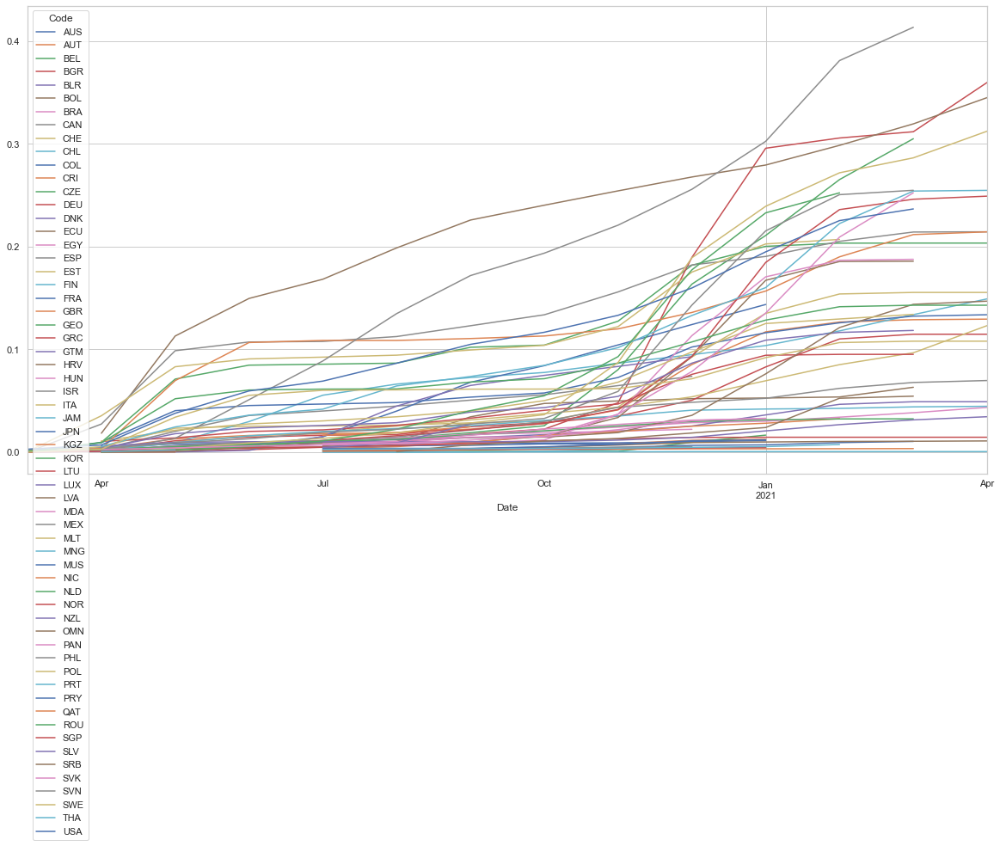

In [458]:
df_acc=df[['Code', 'Date', 'accumulated']]
df_acc['Date'] = pd.to_datetime(df_acc['Date'])
df_acc=df_acc.groupby(by=[df_acc['Date'].dt.to_period('m'), df_acc['Code']]).mean().reset_index()
df_acc=df_acc.pivot(index="Date",columns="Code",values="accumulated")
df_acc.plot()

* We can see the different "waves" through time March-April and November-December
* Special increase of accumulated deaths around March-April and October-November 2020 and January 2021
* Accumulated deaths seem to be stabilized after February
* There are is significantly less data from January 2021

In [459]:
alt.Chart(df).mark_point().encode(
    x='accumulated',
    y='reproduction_rate'
)

alt.Chart(...)

* We can clearly see a relation between accumulated deaths and reproduction rate. Accumulated also serves as proy variable of accumulated inmunity. It can be clearly seen that when accumulated cases are close to 0 reproduction rate ranges between 0 and 4.25
* Once accumulated is over 0.15 it can be clearly appreciated how reproduction rate tends to stabalize towards 1.
* It seems like government restrictions aim to find a reprodcution rate of 1.

### Infections value

In [460]:
alt.Chart(df).mark_point().encode(
    x='infections_value',
    y='reproduction_rate'
)

alt.Chart(...)

* Apparently the only relation between infections_value and reproduction rate is that as infection_value increases reproduction rate tends to be stabalized towards 1, this might be due to governments applying restrictions, when there are high values of infected people recorded.

### Vaccinations

<ipython-input-461-34fea4085abf>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_acc['Date'] = pd.to_datetime(df_acc['Date'])


<AxesSubplot:xlabel='Date'>

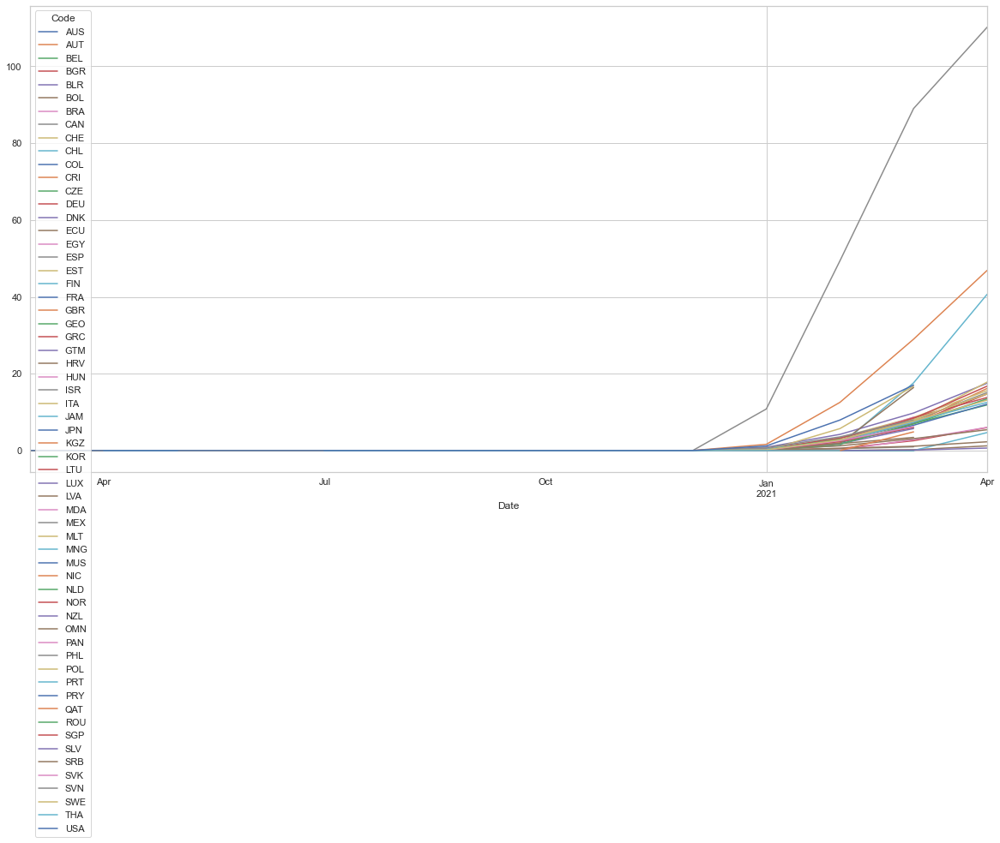

In [461]:
df_acc=df[['Code', 'Date', 'total_vaccinations_per_100']]
df_acc['Date'] = pd.to_datetime(df_acc['Date'])
df_acc=df_acc.groupby(by=[df_acc['Date'].dt.to_period('m'), df_acc['Code']]).mean().reset_index()
df_acc=df_acc.pivot(index="Date",columns="Code",values="total_vaccinations_per_100")
df_acc.plot()

* Vaccinations tend to have values form February 2021 forward in almost all countries. This will be complicated for our specific case since, our model may not be able to include such variable due to lack o information in most of the dataset, and small effect in our target variable due to unseen effect on number of positive cases. The effect of such variable might have bigger impact on number of deaths, since vaccine doses are at first administered to elderly people who are more prone on dying of covid-19.

In [462]:
alt.Chart(df).mark_point().encode(
    x='total_vaccinations_per_100',
    y='reproduction_rate'
)

alt.Chart(...)

* Vaccinations with values close to 0 are related with high values of reproduction_rate, once vaccination is included reproduction rate values tend to be between 1.5 and 0.5. This is due to the fact that reproduction rares have generally be wildly stabilized and its range of values has decreased over time.

### Number of arrivals per country

In [463]:
num_of_arrivals=df[['Code','number_of_arrivals']]
num_of_arrivals=num_of_arrivals.groupby(by=[num_of_arrivals['Code']]).mean().reset_index().sort_values('number_of_arrivals')

num_of_arrivals_plot = alt.Chart(num_of_arrivals).mark_bar().encode(color='Code',
    x=alt.X('Code',
            sort=alt.Sort(field='number_of_arrivals',
                         order='descending')
    ),
    y='number_of_arrivals',
    tooltip='Code'
).properties(
    width=800
)
num_of_arrivals_plot

alt.Chart(...)

* At first sight we can see that countries with higher number of arrivals are countries that have been most affected by Covid-19. Countries such us France, Usa, Spain, Italy, Great Britain or Germany.
* This data refers to tourists arrival per country, therefore it also reveals the mobility and iteration of population inside the country. Such value may be helpful to indicate those countries that are more prominent on having an uncontroled reproduction rate.

In [464]:
alt.Chart(df).mark_point().encode(color='Code',
    x='number_of_arrivals',
    y='reproduction_rate'
)

alt.Chart(...)

* We can see that countries with less than 20 million arrivals do have some high reproduction rates around 2.5, however very few countries with number of arrivals higher than 20 million seem to have a lot more reproduction rate appereances of values higher than 2.5 in proportion. 

### Youth unemployment per country

In [465]:
youth_unemployment_df=df[['Code','youth_unemployment']]

youth_unemployment_df=youth_unemployment_df.groupby(by=[youth_unemployment_df['Code']])\
                                 .mean().reset_index().sort_values('youth_unemployment')

youth_unemployment_df_plot = alt.Chart(youth_unemployment_df).mark_bar().encode(color='Code',
    x=alt.X('Code',sort=alt.Sort(field='youth_unemployment',order='descending')),
    y='youth_unemployment',
    tooltip='Code').properties(width=800)
youth_unemployment_df_plot

alt.Chart(...)

* Same case as with number of arrivals but a little less indicative. We can see some of the most affected countries by covid-19 on the top, Spain and Italy. Youth unemployment might have relation with the spread of te virus, since it has been pointed out youth as a source of spread.

### Urban population

In [466]:
urbanization_df=df[['Code','urban_population']]

urbanization_df=urbanization_df.groupby(by=[urbanization_df['Code']])\
                                 .mean().reset_index().sort_values('urban_population')

urbanization_df = alt.Chart(urbanization_df).mark_bar().encode(color='Code',
    x=alt.X('Code',sort=alt.Sort(field='urban_population',order='descending')),
    y='urban_population',
    tooltip='Code').properties(width=800)
urbanization_df

alt.Chart(...)

* Countries with highest values of urbanization are Singapore, Qatar and Belgium. 
* Apparently there are is no significant correlation between urban_population and reproduction_rate, based on countries most affected recorded.

### Temperature and Precipitation

/opt/anaconda3/lib/python3.8/site-packages/seaborn/relational.py:929: UserWarning: relplot is a figure-level function and does not accept the ax= paramter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


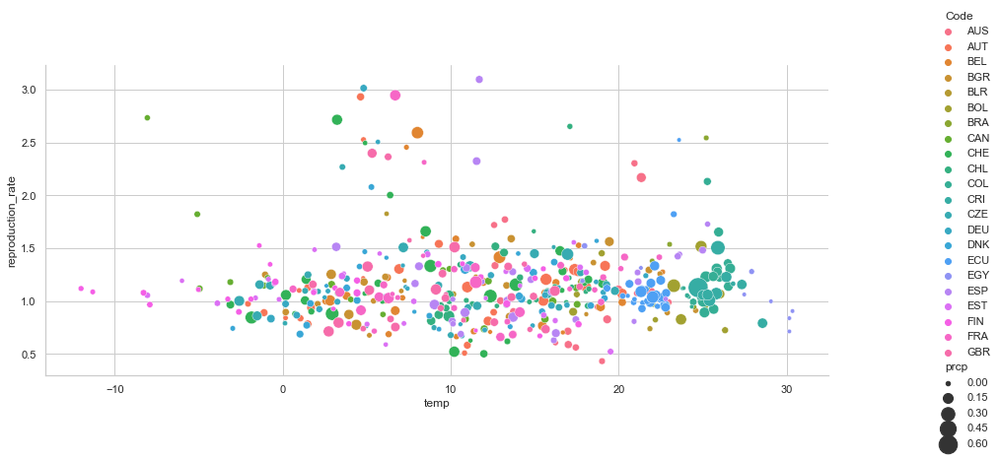

In [467]:
df['year']=pd.to_datetime(df['Date']).dt.year
g = sns.relplot(
    data=df.head(500),
    x="temp", y="reproduction_rate",size="prcp", hue="Code", sizes=(20, 400), ax=ax
)
g.fig.set_size_inches(15,5)

In [468]:
alt.Chart(df).mark_point().encode(
    x='temp',
    y='reproduction_rate'
)

alt.Chart(...)

* As seen on the graph, there seems to be a tendency of high reproduction rates when temperatures range values 0 to 10.
* Very low temperatures and very high temperatures are also related with low rates of reproduction

In [469]:
alt.Chart(df).mark_point().encode(
    x='prcp',
    y='reproduction_rate'
)

alt.Chart(...)

* It can be appreciated that when precipitation ranges high values reproduction rates seem to vanish.
* In the other hand most abnormal and high values of reproduction rate seem to be related with low values of precipitation.

## Conclusions

* Our dataset after necessary null removal is composed of 2224 rows with 33 columns with information of 61 countries.
* Mobility trends and restrictions seem to have highest relations among all features with our target variable reproduction_rate.
* Youth unemployment and number of arrivals when sorted by countries do seem to have some kind of relation based on recorded data. Countries that have been most affected by covid-19 are associated with high values in youth unemployment and number of arrivals. However urban population does not seem to have the same effect. 
* Vaccinations values are seeing in the dataset from Febrarury 2021. 
* Multicollinearity between features is evident based on correlation matrix and VIF analysis.
* Multicollinearity has most to do with restrictions and mobility indexes, the reason behind it is that restrictions are applied at the same time, and mobility indexes also increase or decrease their values at the same time.
* Reproduction rate values tend to be stabalized and its range of values tends to increasingly be closer to 1 as time passes.
* reproduction_rate_week_n-2 has a collinearity of 0.8 with our target variable.